In [57]:
# Import the PyTorch library
import torch

# Import the neural network module from PyTorch
import torch.nn as nn

# Import the functional module from PyTorch for common operations
import torch.nn.functional as F

# Import the optimization module from PyTorch for updating parameters during training
import torch.optim as optim

# Import the numpy library for numerical operations
import numpy as np

# Import the matplotlib.pyplot module for creating visualizations
import matplotlib.pyplot as plt

# Enable inline plotting for Jupyter notebooks or IPython environments
%matplotlib inline


## Global Settings

In [58]:
LABELS = [0, 0, 1, 1]
CENTERS = [(-3, -3), (3, 3), (3, -3), (-3, 3)]
# Coordinates for centering the gaussian data distribution 

## Defining the Model

In [59]:
# Define a class named MultilayerPerceptron that inherits from nn.Module
class MultilayerPerceptron(nn.Module):
    """
    A Multilayer Perceptron (MLP) with customizable architecture.
    """
    
    # Constructor method (__init__) for initializing instances of the MultilayerPerceptron class
    def __init__(self, input_size, hidden_size=2, output_size=3, 
                 num_hidden_layers=1, hidden_activation=nn.Sigmoid):
        """Initialize weights.

        Args:
            input_size (int): size of the input 
            hidden_size (int): size of the hidden layers
            output_size (int): size of the output
            num_hidden_layers (int): number of hidden layers
            hidden_activation (torch.nn.*): the activation class
        """
        # Call the constructor of the parent class (nn.Module)
        super(MultilayerPerceptron, self).__init__()
        
        # Create a ModuleList to store the layers of the MLP
        self.module_list = nn.ModuleList()
        
        # Initialize interim input and output sizes for the hidden layers
        interim_input_size = input_size
        interim_output_size = hidden_size
        
        # Loop to create hidden layers with specified size and activation
        for _ in range(num_hidden_layers):
            self.module_list.append(nn.Linear(interim_input_size, interim_output_size))
            self.module_list.append(hidden_activation())
            interim_input_size = interim_output_size
            
        # Create the final fully connected layer for output
        self.fc_final = nn.Linear(interim_input_size, output_size)
        
        # Cache to store the forward pass outputs for visualization or debugging
        self.last_forward_cache = []

    # Forward method for specifying the forward pass of the MLP
    def forward(self, x, apply_softmax=False):
        """The forward pass of the MLP
        
        Args:
            x (torch.Tensor): an input data tensor. 
                x.shape should be (batch, input_dim)
            apply_softmax (bool): a flag for the softmax activation
                should be false if used with the Cross Entropy losses
        Returns:
            the resulting tensor. tensor.shape should be (batch, output_dim)
        """
        # Initialize the forward cache
        self.last_forward_cache = []
        self.last_forward_cache.append(x.to("cpu").numpy())

        # Loop through the layers in the module list
        for module in self.module_list:
            x = module(x)
            self.last_forward_cache.append(x.to("cpu").data.numpy())
            
        # Apply the final fully connected layer
        output = self.fc_final(x)
        self.last_forward_cache.append(output.to("cpu").data.numpy())

        # Apply softmax activation if specified
        if apply_softmax:
            output = F.softmax(output, dim=1)   
        return output


In [60]:
## Get Data Function

In [61]:
# Define a function named get_toy_data that generates toy data for classification
def get_toy_data(batch_size):
    # Assert that the number of centers and labels are equal
    assert len(CENTERS) == len(LABELS), 'centers should have equal number labels'
    
    # Initialize empty lists to store input data and target labels
    x_data = []
    y_targets = np.zeros(batch_size)
    
    # Get the number of centers
    n_centers = len(CENTERS)
    
    # Loop to generate toy data for each batch
    for batch_i in range(batch_size):
        # Randomly select a center index
        center_idx = np.random.randint(0, n_centers)
        
        # Generate a data point using normal distribution around the selected center
        x_data.append(np.random.normal(loc=CENTERS[center_idx]))
        
        # Set the target label based on the selected center's label
        y_targets[batch_i] = LABELS[center_idx]
    
    # Convert the lists to PyTorch tensors
    return torch.tensor(x_data, dtype=torch.float32), torch.tensor(y_targets, dtype=torch.int64)


## Visualizing Results Function

In [62]:
# Define a function named visualize_results for plotting the results of a perceptron
def visualize_results(perceptron, x_data, y_truth, n_samples=1000, ax=None, epoch=None, 
                      title='', levels=[0.3, 0.4, 0.5], linestyles=['--', '-', '--']):
    # Get predictions from the perceptron and convert to class labels
    _, y_pred = perceptron(x_data, apply_softmax=True).max(dim=1)
    y_pred = y_pred.data.numpy()

    # Convert input data and ground truth labels to numpy arrays
    x_data = x_data.data.numpy()
    y_truth = y_truth.data.numpy()

    # Get the number of classes based on the set of unique labels
    n_classes = len(set(LABELS))

    # Initialize empty lists to store data for each class
    all_x = [[] for _ in range(n_classes)]
    all_colors = [[] for _ in range(n_classes)]
    
    # Colors and markers for plotting
    colors = ['black', 'white']
    markers = ['o', '*']
    
    # Populate lists for each class based on predictions and ground truth
    for x_i, y_pred_i, y_true_i in zip(x_data, y_pred, y_truth):
        all_x[y_true_i].append(x_i)
        if y_pred_i == y_true_i:
            all_colors[y_true_i].append("white")
        else:
            all_colors[y_true_i].append("black")

    # Convert the lists of data points for each class to numpy arrays
    all_x = [np.stack(x_list) for x_list in all_x]

    # If no axis is provided, create a new subplot
    if ax is None:
        _, ax = plt.subplots(1, 1, figsize=(10, 10))
        
    # Plot the data points for each class with different markers and colors
    for x_list, color_list, marker in zip(all_x, all_colors, markers):
        ax.scatter(x_list[:, 0], x_list[:, 1], edgecolor="black", marker=marker, facecolor=color_list, s=100)
    
    # Set x-axis and y-axis limits based on the data points
    xlim = (min([x_list[:,0].min() for x_list in all_x]), 
            max([x_list[:,0].max() for x_list in all_x]))
    ylim = (min([x_list[:,1].min() for x_list in all_x]), 
            max([x_list[:,1].max() for x_list in all_x]))
            
    # Generate a hyperplane for each class and plot contours
    xx = np.linspace(xlim[0], xlim[1], 30)
    yy = np.linspace(ylim[0], ylim[1], 30)
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T
    
    for i in range(n_classes):
        Z = perceptron(torch.tensor(xy, dtype=torch.float32), 
                       apply_softmax=True)
        Z  = Z[:, i].data.numpy().reshape(XX.shape)
        ax.contour(XX, YY, Z, colors=colors[i], levels=levels, linestyles=linestyles)
    
    # Add title to the plot
    plt.suptitle(title)
    
    # Display the current epoch if provided
    if epoch is not None:
        plt.text(xlim[0], ylim[1], "Epoch = {}".format(str(epoch)))


## Initial Data Plot

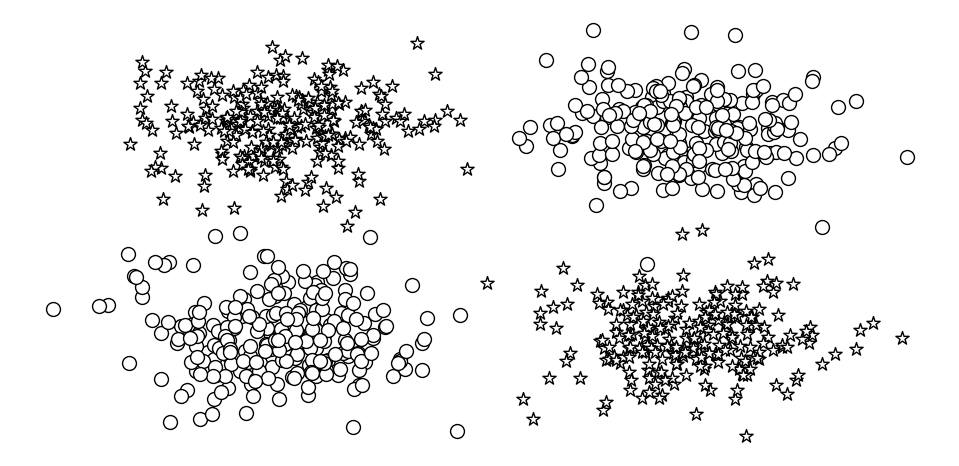

In [63]:
# Set a random seed for reproducibility
seed = 24

# Set the random seed for torch and NumPy to the specified value
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

# Generate toy data using the get_toy_data function
x_data, y_truth = get_toy_data(batch_size=1000)

# Convert tensors to NumPy arrays
x_data = x_data.data.numpy()
y_truth = y_truth.data.numpy().astype(np.int64)

# Get the number of classes based on the set of unique labels
n_classes = len(set(LABELS))

# Initialize empty lists to store data and colors for each class
all_x = [[] for _ in range(n_classes)]
all_colors = [[] for _ in range(n_classes)]

# Colors and markers for plotting
colors = ['black', 'white']
markers = ['o', '*']

# Populate lists for each class based on the true labels
for x_i, y_true_i in zip(x_data, y_truth):
    all_x[y_true_i].append(x_i)
    all_colors[y_true_i].append(colors[y_true_i])

# Convert the lists of data points for each class to NumPy arrays
all_x = [np.stack(x_list) for x_list in all_x]

# Create a subplot with a specified size
_, ax = plt.subplots(1, 1, figsize=(10,5))

# Plot data points for each class with different markers and colors
for x_list, color_list, marker in zip(all_x, all_colors, markers):
    ax.scatter(x_list[:, 0], x_list[:, 1], edgecolor='black', marker=marker, facecolor="white", s=100)

# Adjust layout for better appearance
plt.tight_layout()

# Turn off axis labels and ticks
plt.axis('off')

# Set an empty title
plt.title("");

# Save the plot as an image file (PNG and PDF formats)
plt.savefig("data.png")
plt.savefig("data.pdf")


## Training a Perceptron

A perceptron is a multilayer perceptron.  To properly discuss it in this light, we will use the variable name `mlp1`.   We use the class above with `num_hidden_layers=0` to create the perceptron.

MultilayerPerceptron(
  (module_list): ModuleList()
  (fc_final): Linear(in_features=2, out_features=2, bias=True)
)


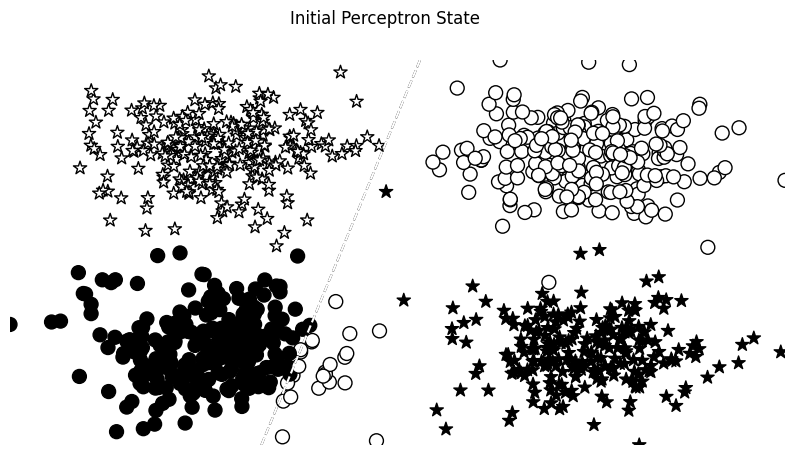

In [80]:
# Define input size and output size based on unique labels in LABELS
input_size = 2
output_size = len(set(LABELS))

# Specify the number of hidden layers and the size of each hidden layer (not used in this case)
num_hidden_layers = 0
hidden_size = 2  # Note: This variable is defined but not used in the provided code

# Set a random seed for reproducibility
seed = 24

# Set the random seed for torch and NumPy to the specified value
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

# Create an instance of the MultilayerPerceptron class
mlp1 = MultilayerPerceptron(input_size=input_size, 
                            hidden_size=hidden_size, 
                            num_hidden_layers=num_hidden_layers, 
                            output_size=output_size)

# Print the structure of the MLP
print(mlp1)

# Set the batch size for toy data
batch_size = 1000

# Generate static toy data using the get_toy_data function
x_data_static, y_truth_static = get_toy_data(batch_size)

# Create a subplot for visualization
fig, ax = plt.subplots(1, 1, figsize=(10,5))

# Visualize the initial state of the perceptron using the visualize_results function
visualize_results(mlp1, x_data_static, y_truth_static, 
                  ax=ax, title='Initial Perceptron State', levels=[0.5])

# Turn off axis labels and ticks
plt.axis('off')

# Save the visualization plot as an image file
plt.savefig('perceptron_initial.png')


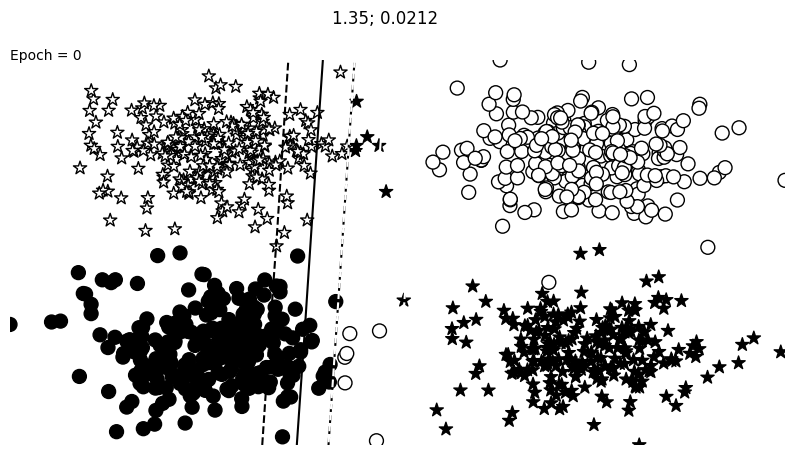

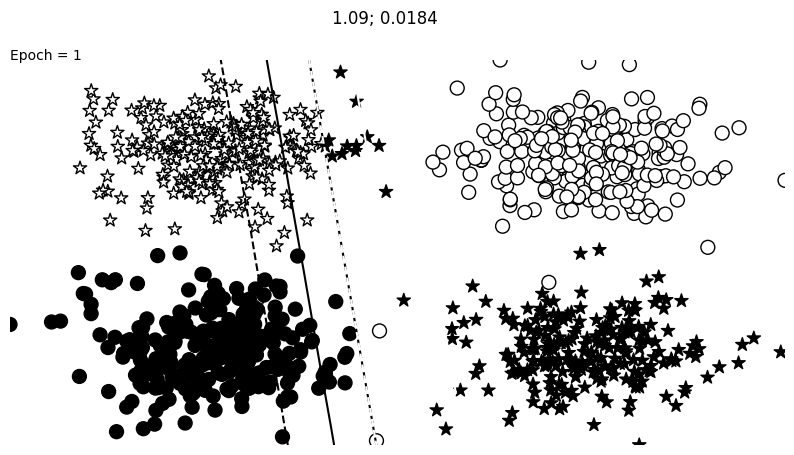

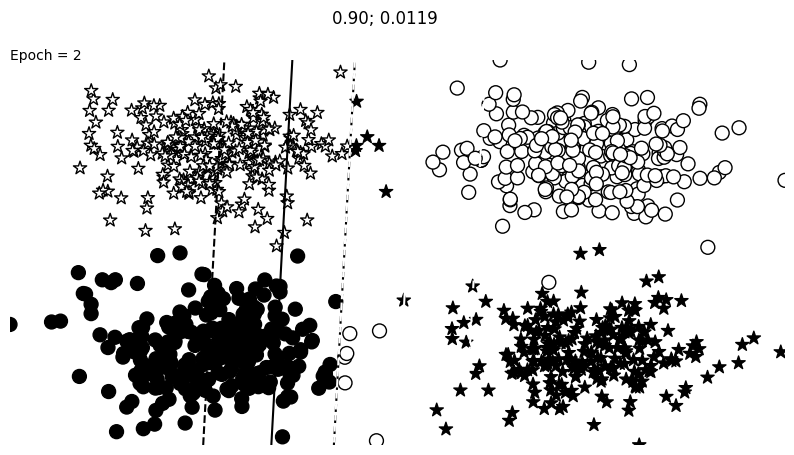

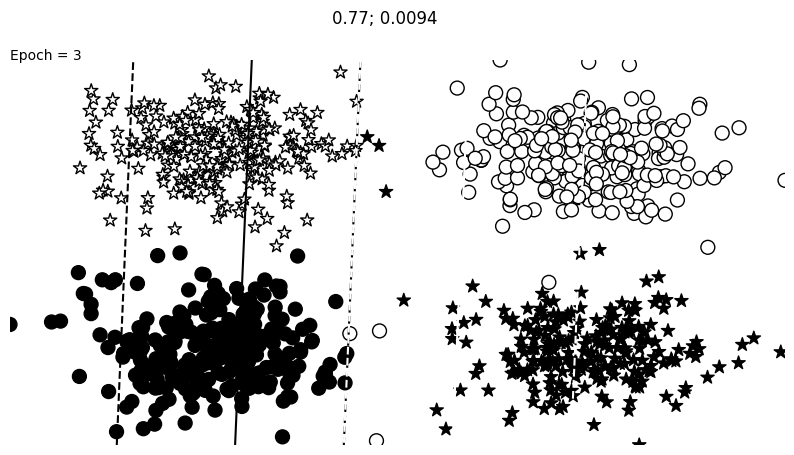

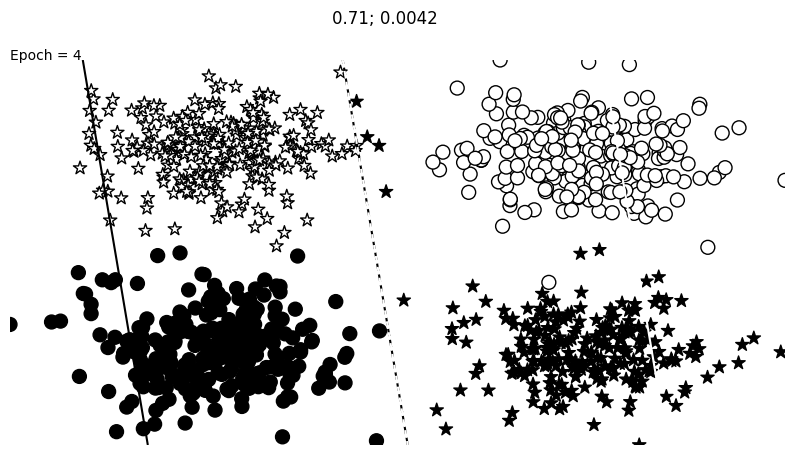

...

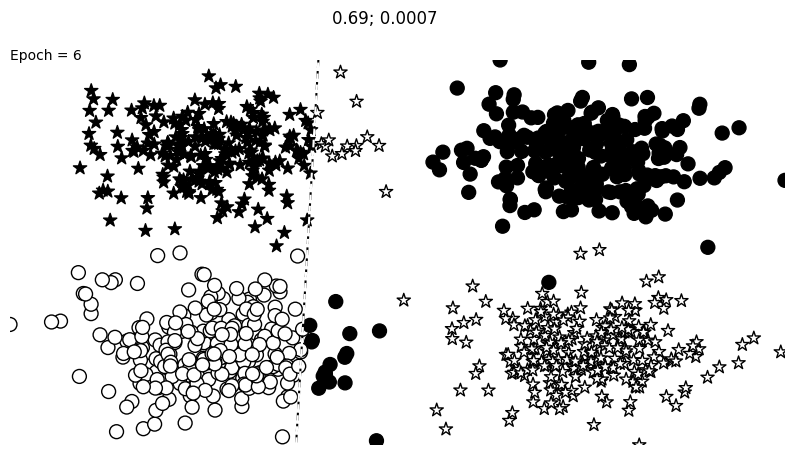

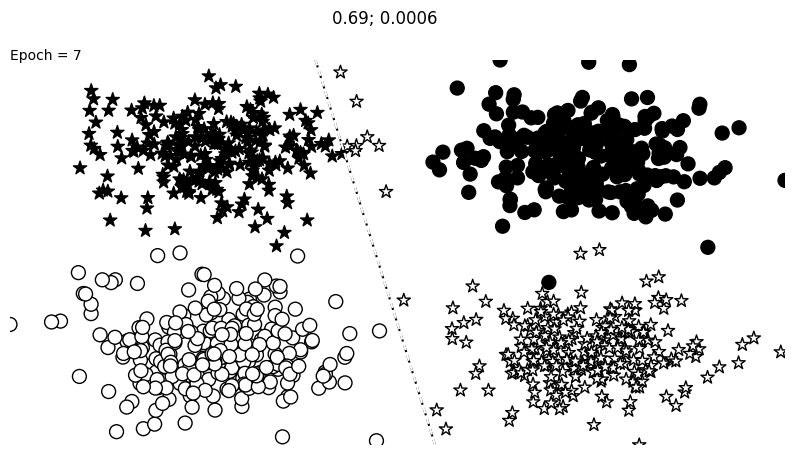

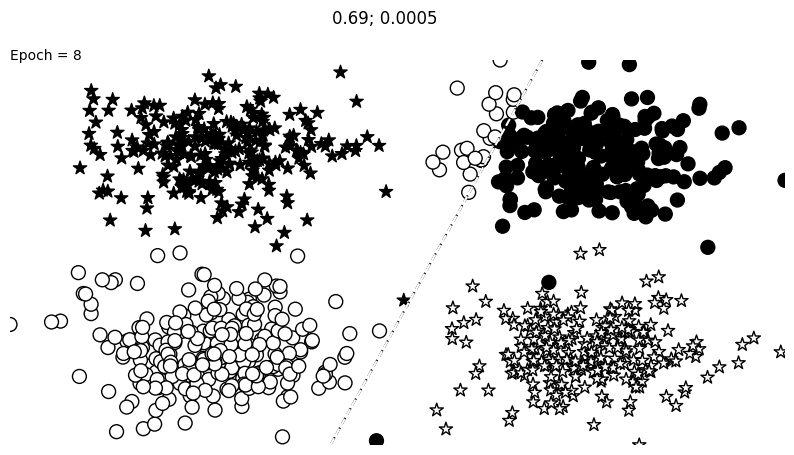

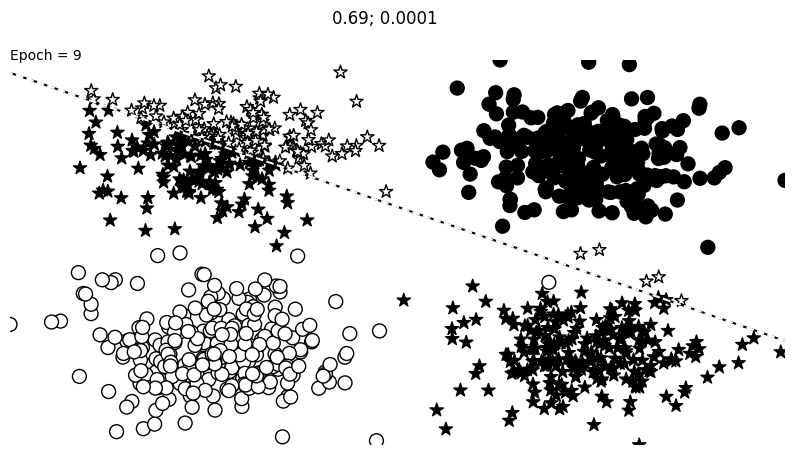

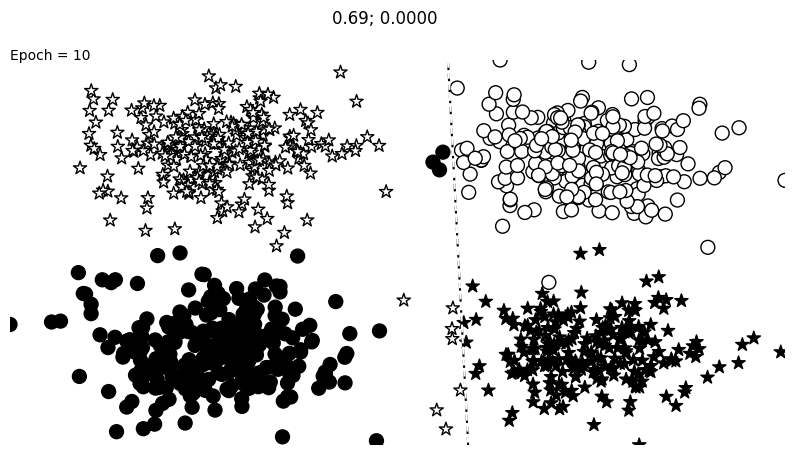

In [65]:
# Initialize an empty list to store losses during training
losses = []

# Set batch size, number of batches per epoch, and maximum number of epochs
batch_size = 10000
n_batches = 10
max_epochs = 10

# Initialize variables for tracking loss changes
loss_change = 1.0
last_loss = 10.0
change_threshold = 1e-3
epoch = 0

# Initialize a list to store image file names for later animation
all_imagefiles = []

# Set the learning rate for the optimizer
lr = 0.01

# Initialize the Adam optimizer with the MLP parameters and learning rate
optimizer = optim.Adam(params=mlp1.parameters(), lr=lr)

# Define the Cross Entropy Loss criterion for classification
cross_ent_loss = nn.CrossEntropyLoss()

# Define a function for early termination based on loss change, change threshold, epoch, and max epochs
def early_termination(loss_change, change_threshold, epoch, max_epochs):
    terminate_for_loss_change = loss_change < change_threshold
    terminate_for_epochs = epoch > max_epochs
    
    return terminate_for_epochs

# Main training loop
while not early_termination(loss_change, change_threshold, epoch, max_epochs):
    for _ in range(n_batches):
        # Step 0: Fetch the data
        x_data, y_target = get_toy_data(batch_size)

        # Step 1: Zero the gradients
        mlp1.zero_grad()

        # Step 2: Run the forward pass .squeeze reduces the size of a tensor along dimensions where the size is 1
        y_pred = mlp1(x_data).squeeze()

        # Step 3: Compute the Cross Entropy loss
        loss = cross_ent_loss(y_pred, y_target.long())

        # Step 4: Compute the backward pass. Computes gradient of loss with respect to weights and biases
        loss.backward()

        # Step 5: Have the optimizer take an optimization step
        optimizer.step()

        # Auxillary: Bookkeeping
        loss_value = loss.item()
        losses.append(loss_value)
        loss_change = abs(last_loss - loss_value)
        last_loss = loss_value

    # Visualization of results and saving the plot
    fig, ax = plt.subplots(1, 1, figsize=(10,5))
    visualize_results(mlp1, x_data_static, y_truth_static, ax=ax, epoch=epoch, 
                      title=f"{loss_value:0.2f}; {loss_change:0.4f}")
    plt.axis('off')
    epoch += 1
    all_imagefiles.append(f'images/perceptron_epoch{epoch}_toylearning.png')
    plt.savefig('perceptr')


## Training a 2 layer Multilayer Perceptron

MultilayerPerceptron(
  (module_list): ModuleList(
    (0): Linear(in_features=2, out_features=2, bias=True)
    (1): Sigmoid()
  )
  (fc_final): Linear(in_features=2, out_features=2, bias=True)
)


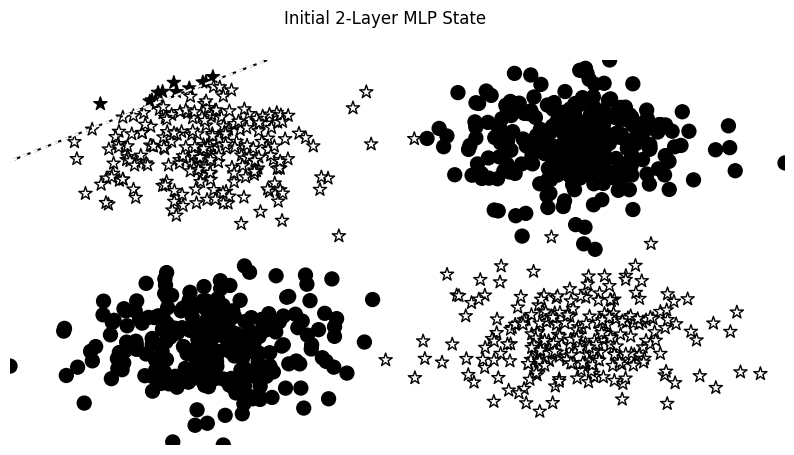

In [84]:
# Define input size and output size based on unique labels in LABELS
input_size = 2
output_size = len(set(LABELS))

# Specify the number of hidden layers and the size of each hidden layer
num_hidden_layers = 1 # Changing this number too drastically will result in not seeing any lines through the data, likely due to overfitting
hidden_size = 2

# Set a random seed for reproducibility
seed = 2

# Set the random seed for torch and NumPy to the specified value
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

# Create an instance of the MultilayerPerceptron class with 1 hidden layer
mlp2 = MultilayerPerceptron(input_size=input_size, 
                            hidden_size=hidden_size, 
                            num_hidden_layers=num_hidden_layers, 
                            output_size=output_size)

# Print the structure of the MLP
print(mlp2)

# Set the batch size for toy data
batch_size = 1000

# Generate static toy data using the get_toy_data function
x_data_static, y_truth_static = get_toy_data(batch_size)

# Create a subplot for visualization
fig, ax = plt.subplots(1, 1, figsize=(10,5))

# Visualize the initial state of the 2-layer MLP using the visualize_results function
visualize_results(mlp2, x_data_static, y_truth_static, 
                  ax=ax, title='Initial 2-Layer MLP State', levels=[0.5])

# Turn off axis labels and ticks
plt.axis('off')

# Save the visualization plot as an image file
plt.savefig('mlp2_initial.png')


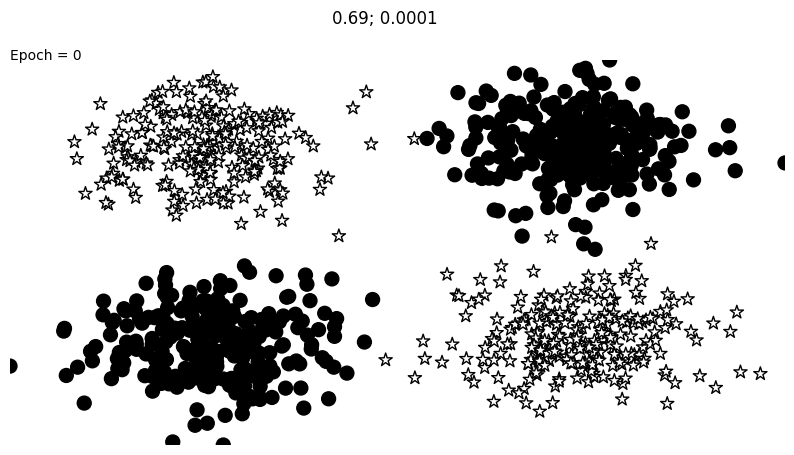

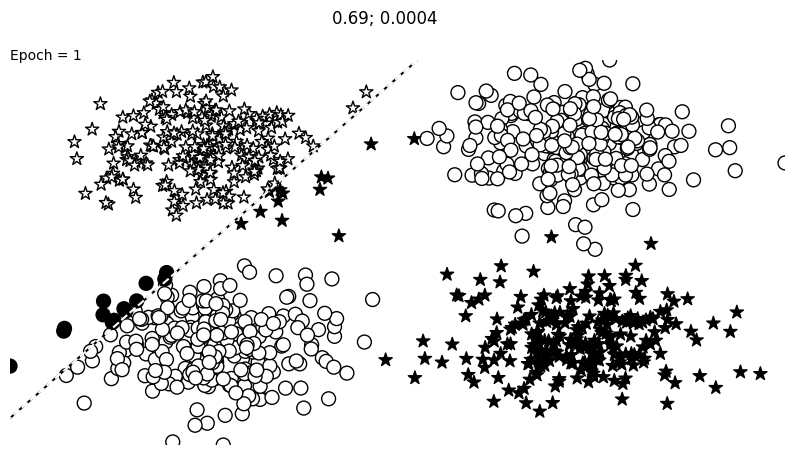

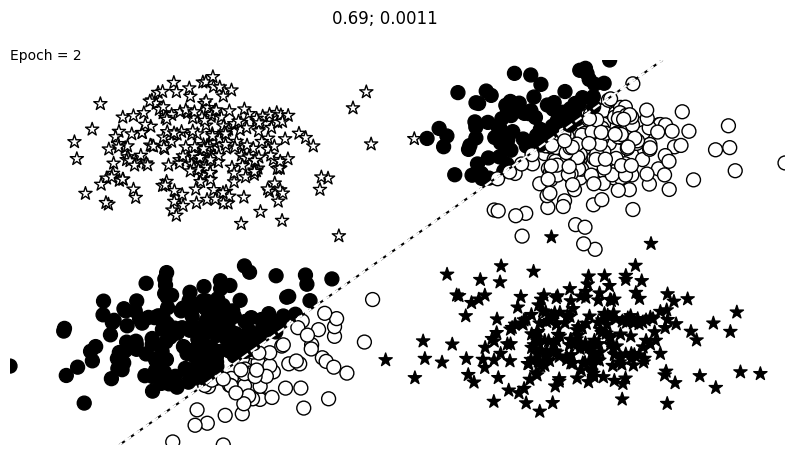

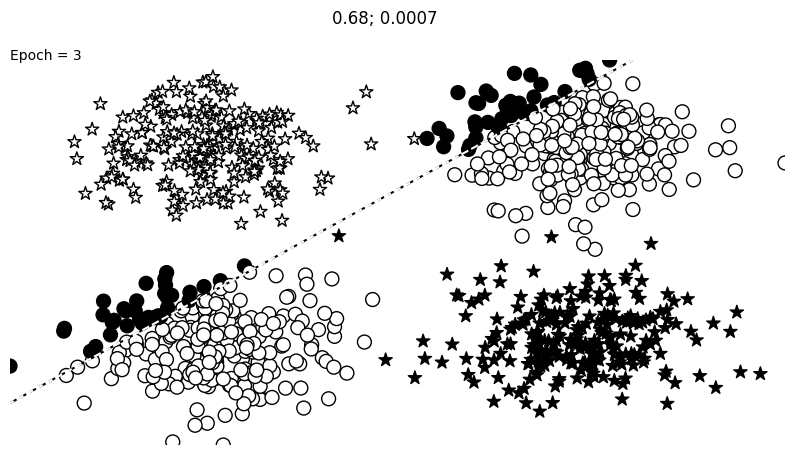

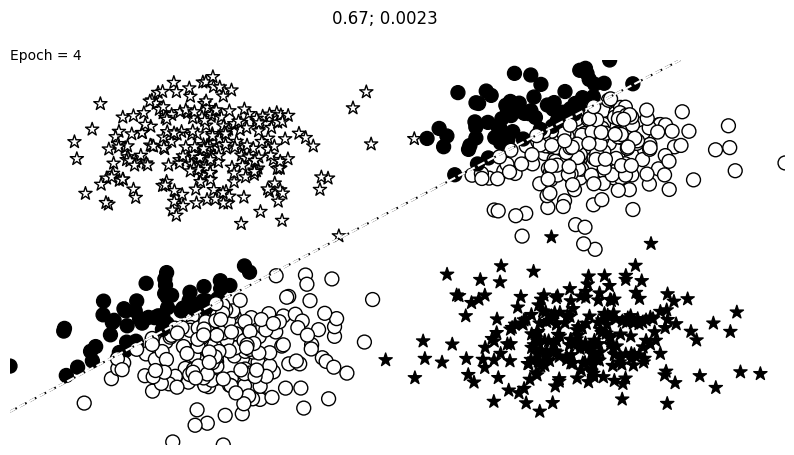

...

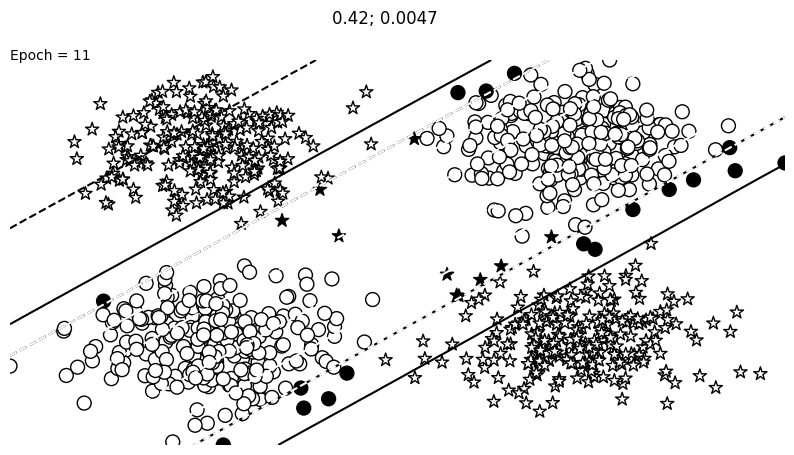

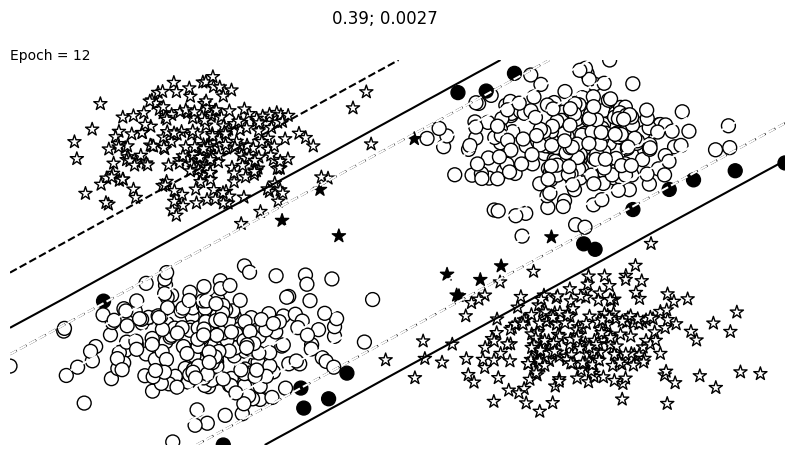

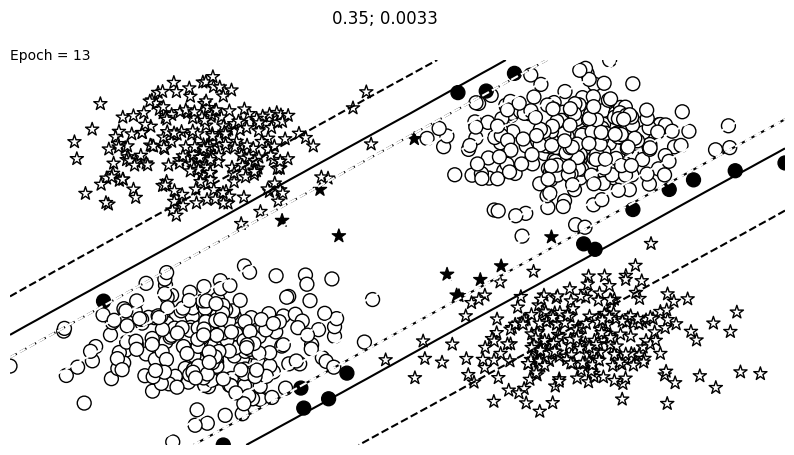

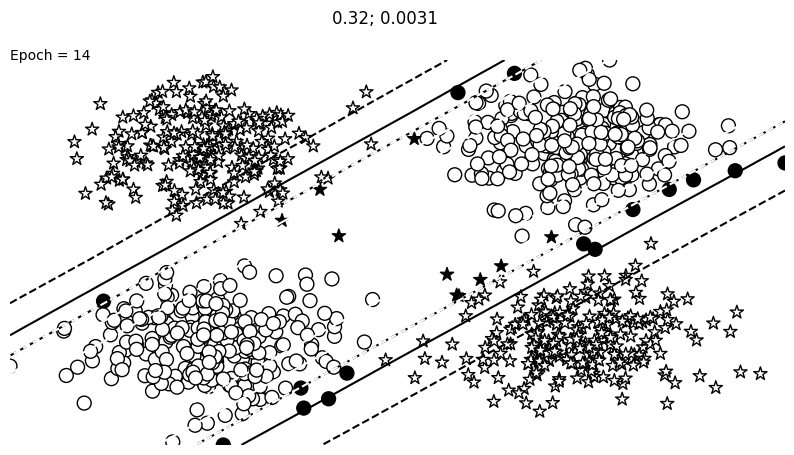

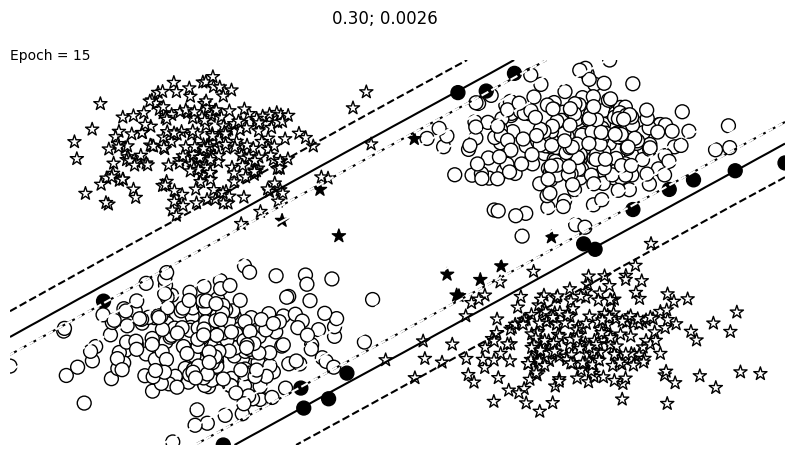

In [85]:
# Initialize an empty list to store losses during training
losses = []

# Set batch size, number of batches per epoch, and maximum number of epochs
batch_size = 10000
n_batches = 10
max_epochs = 15

# Initialize variables for tracking loss changes
loss_change = 1.0
last_loss = 10.0
change_threshold = 1e-5
epoch = 0

# Initialize a list to store image file names for later animation
all_imagefiles = []

# Set the learning rate for the optimizer
lr = 0.01

# Initialize the Adam optimizer with the MLP parameters and learning rate
optimizer = optim.Adam(params=mlp2.parameters(), lr=lr)

# Define the Cross Entropy Loss criterion for classification
cross_ent_loss = nn.CrossEntropyLoss()

# Define a function for early termination based on loss change, change threshold, epoch, and max epochs
def early_termination(loss_change, change_threshold, epoch, max_epochs):
    terminate_for_loss_change = loss_change < change_threshold    
    terminate_for_epochs = epoch > max_epochs
    
    return terminate_for_epochs

# Main training loop
while not early_termination(loss_change, change_threshold, epoch, max_epochs):
    for _ in range(n_batches):
        # Step 0: Fetch the data
        x_data, y_target = get_toy_data(batch_size)

        # Step 1: Zero the gradients
        mlp2.zero_grad()

        # Step 2: Run the forward pass
        y_pred = mlp2(x_data).squeeze()

        # Step 3: Compute the Cross Entropy loss
        loss = cross_ent_loss(y_pred, y_target.long())

        # Step 4: Compute the backward pass
        loss.backward()

        # Step 5: Have the optimizer take an optimization step
        optimizer.step()

        # Auxillary: Bookkeeping
        loss_value = loss.item()
        losses.append(loss_value)
        loss_change = abs(last_loss - loss_value)
        last_loss = loss_value
                
    # Visualization of results and saving the plot
    fig, ax = plt.subplots(1, 1, figsize=(10,5))
    visualize_results(mlp2, x_data_static, y_truth_static, ax=ax, epoch=epoch, 
                      title=f"{loss_value:0.2f}; {loss_change:0.4f}")
    plt.axis('off')
    epoch += 1
    all_imagefiles.append(f'images/mlp2_epoch{epoch}_toylearning.png')
    plt.savefig('mlp2_final')


## Training a 3 layer Multilayer Perceptron

MultilayerPerceptron(
  (module_list): ModuleList(
    (0): Linear(in_features=2, out_features=2, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=2, out_features=2, bias=True)
    (3): Sigmoid()
  )
  (fc_final): Linear(in_features=2, out_features=2, bias=True)
)


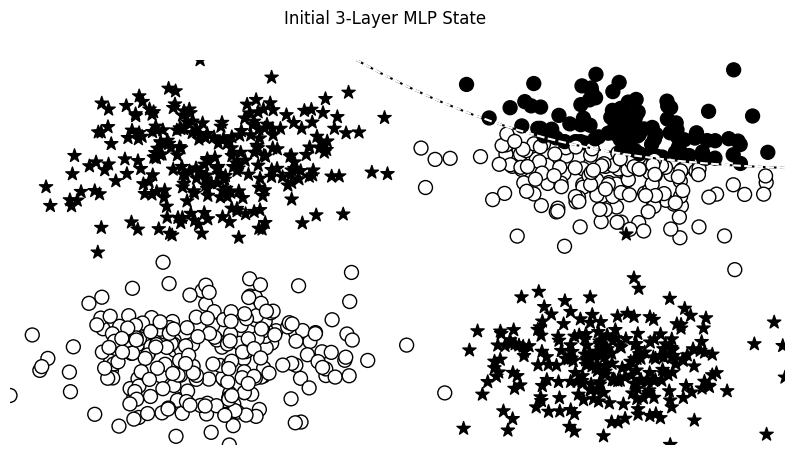

In [68]:
# Set input size, output size, number of hidden layers, and hidden layer size
input_size = 2
output_size = len(set(LABELS))
num_hidden_layers = 2
hidden_size = 2

# Set the random seed for reproducibility
seed = 399
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

# Initialize a 3-layer Multilayer Perceptron (MLP) model
mlp3 = MultilayerPerceptron(input_size=input_size, 
                           hidden_size=hidden_size, 
                           num_hidden_layers=num_hidden_layers, 
                           output_size=output_size)
print(mlp3)

# Set the batch size for generating toy data
batch_size = 1000

# Generate static toy data for visualization
x_data_static, y_truth_static = get_toy_data(batch_size)

# Create a subplot for visualization
fig, ax = plt.subplots(1, 1, figsize=(10,5))

# Visualize the initial state of the 3-layer MLP
visualize_results(mlp3, x_data_static, y_truth_static, 
                  ax=ax, title='Initial 3-Layer MLP State', levels=[0.5])

# Turn off axis labels
plt.axis('off')

# Save the initial visualization as an image
plt.savefig('mlp3_initial.png')


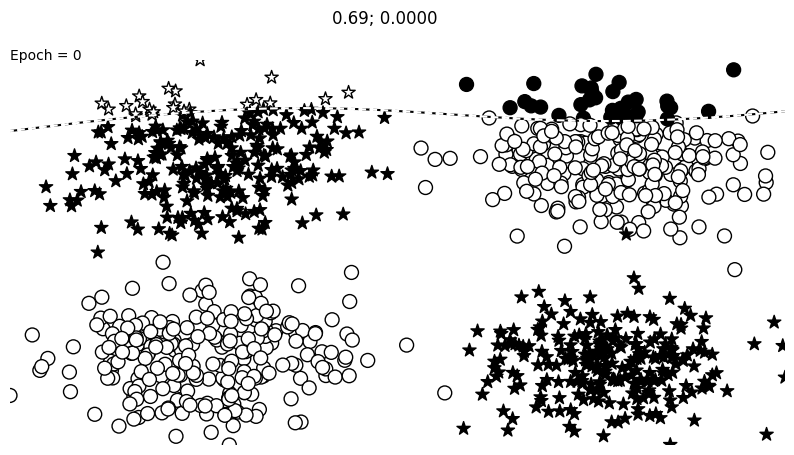

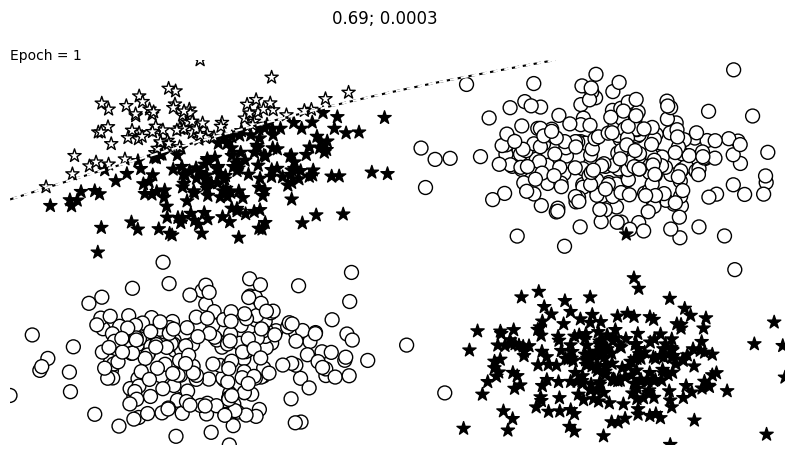

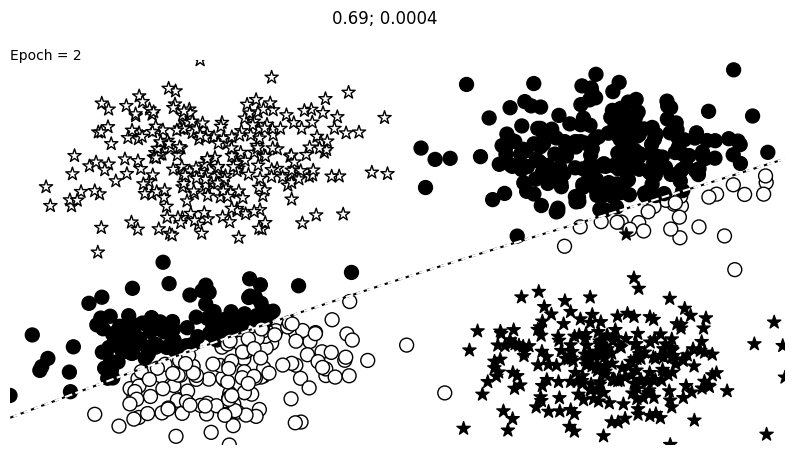

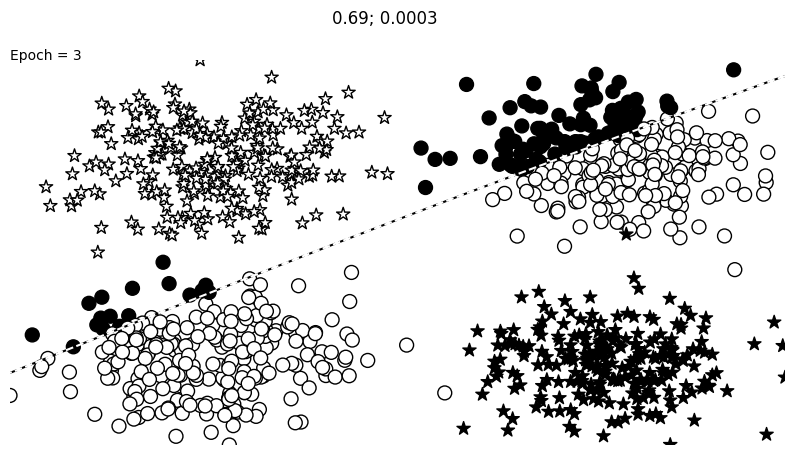

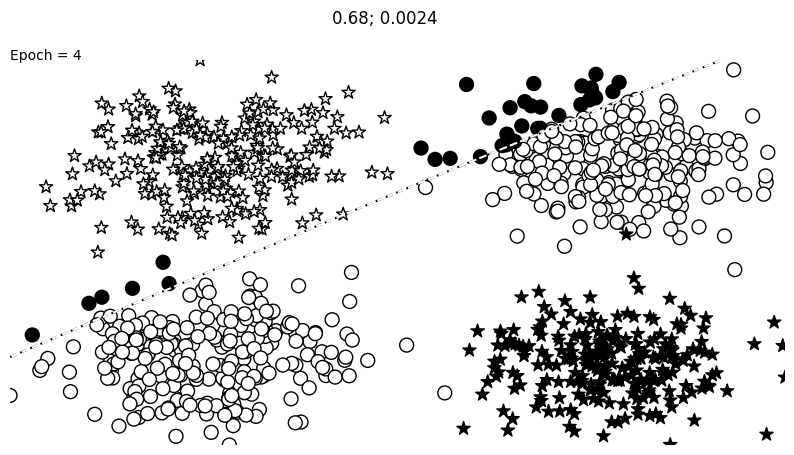

...

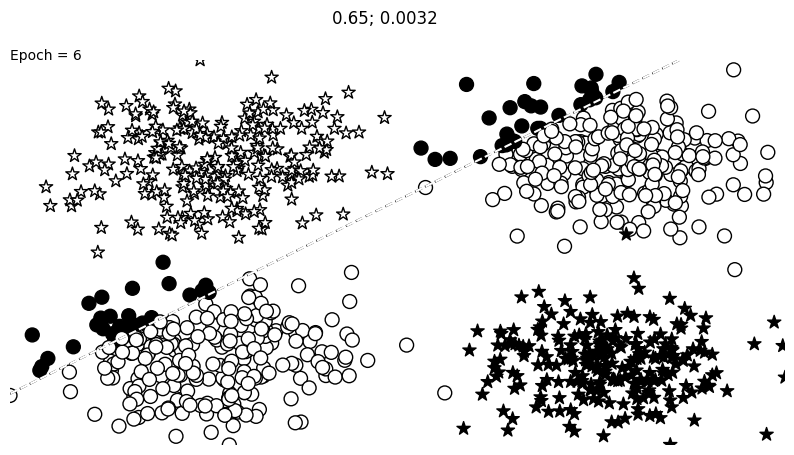

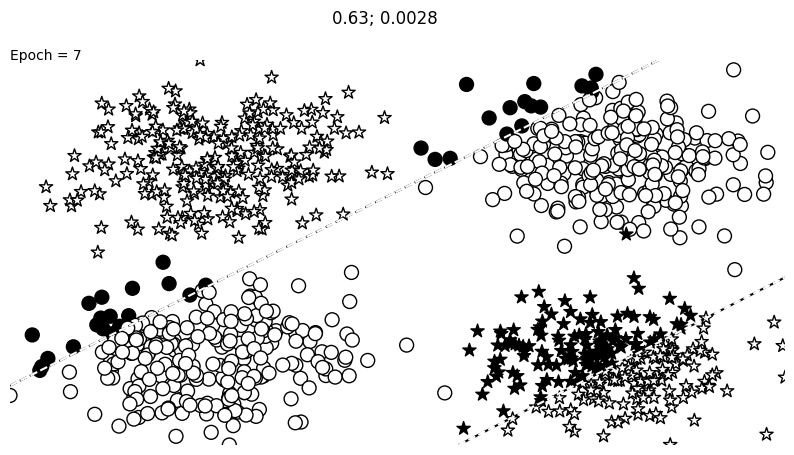

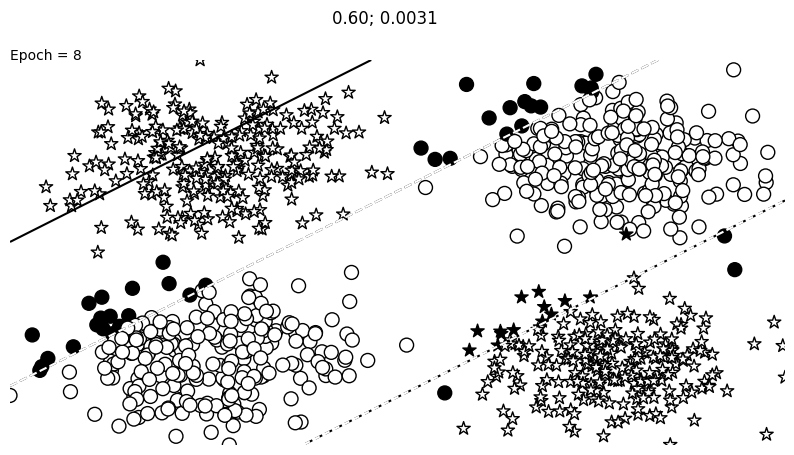

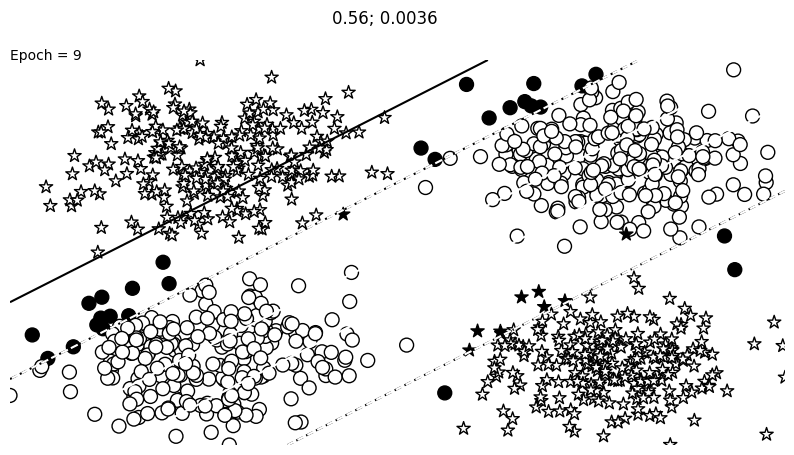

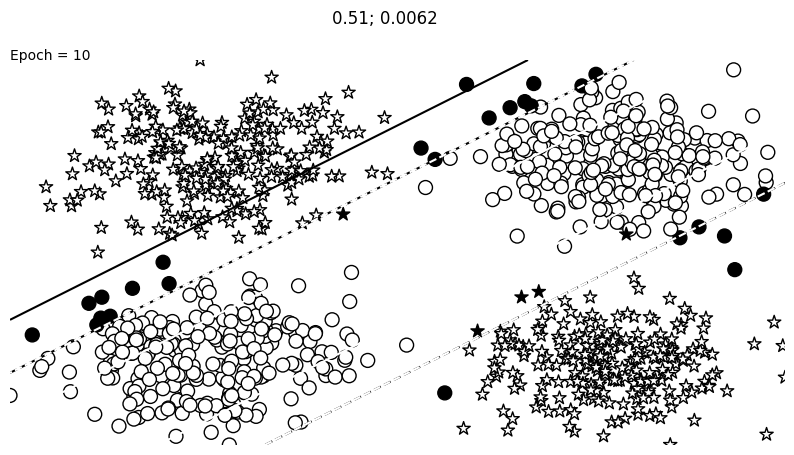

In [69]:
# Initialize an empty list to store loss values during training
losses = []

# Set the batch size, number of batches, and maximum number of epochs
batch_size = 10000
n_batches = 10
max_epochs = 10

# Initialize variables for tracking loss change, last loss, change threshold, and epoch
loss_change = 1.0
last_loss = 10.0
change_threshold = 1e-5
epoch = 0

# Initialize an empty list to store file paths of generated images
all_imagefiles = []

# Set the learning rate for the Adam optimizer
lr = 0.01

# Initialize the Adam optimizer for the 3-layer MLP model
optimizer = optim.Adam(params=mlp3.parameters(), lr=lr)

# Define the CrossEntropyLoss as the loss function
cross_ent_loss = nn.CrossEntropyLoss()

# Define a function for early termination based on loss change and maximum epochs
def early_termination(loss_change, change_threshold, epoch, max_epochs):
    terminate_for_loss_change = loss_change < change_threshold
    terminate_for_epochs = epoch > max_epochs
    
    # Return True if either termination condition is met
    return terminate_for_epochs

# Continue training until early termination conditions are met
while not early_termination(loss_change, change_threshold, epoch, max_epochs):
    for _ in range(n_batches):
        # Step 0: Fetch the toy data
        x_data, y_target = get_toy_data(batch_size)
 
        # Step 1: Zero the gradients
        mlp3.zero_grad()
        
        # Step 2: Forward pass to get predictions
        y_pred = mlp3(x_data).squeeze()
        
        # Step 3: Compute the CrossEntropyLoss
        loss = cross_ent_loss(y_pred, y_target.long())

        # Step 4: Backward pass to compute gradients
        loss.backward()
        
        # Step 5: Optimizer takes an optimization step
        optimizer.step()
        
        # Auxiliary: Bookkeeping
        loss_value = loss.item()
        losses.append(loss_value)
        loss_change = abs(last_loss - loss_value)
        last_loss = loss_value
                
    # Create a subplot for visualization
    fig, ax = plt.subplots(1, 1, figsize=(10,5))
    
    # Visualize the results of the trained MLP
    visualize_results(mlp3, x_data_static, y_truth_static, ax=ax, epoch=epoch, 
                      title=f"{loss_value:0.2f}; {loss_change:0.4f}")
    
    # Turn off axis labels for cleaner visualization
    plt.axis('off')
    
    # Increment the epoch counter
    epoch += 1
    
    # Save the visualization as an image file
    all_imagefiles.append(f'images/mlp3_epoch{epoch}_toylearning.png')
    plt.savefig('mlp3_final.png')


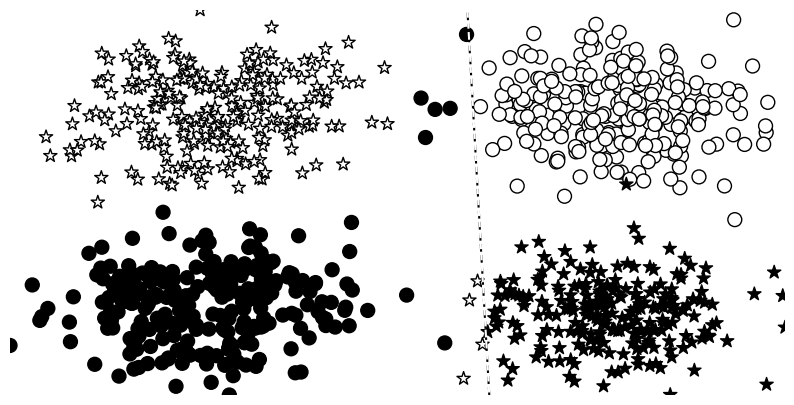

In [70]:
# Create a single subplot with specified size
_, ax = plt.subplots(1, 1, figsize=(10, 5))

# Visualize the results of the trained perceptron on static data
visualize_results(mlp1, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=ax)

# Turn off axis labels for cleaner visualization
plt.axis('off')

# Save the visualization as an image file
plt.savefig('perceptron_final.png')


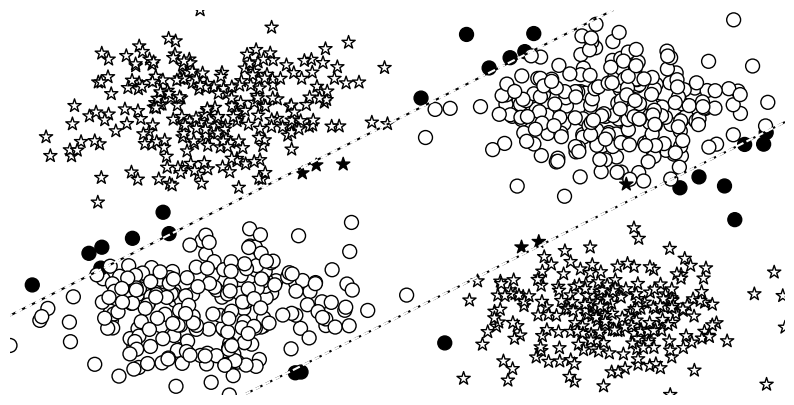

In [71]:
# Create a single subplot with specified size
_, ax = plt.subplots(1, 1, figsize=(10, 5))

# Visualize the results of the trained MLP (mlp2) on static data
visualize_results(mlp2, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=ax)

# Turn off axis labels for cleaner visualization
plt.axis('off')

# Save the visualization as an image file
plt.savefig('mlp2_final.png')


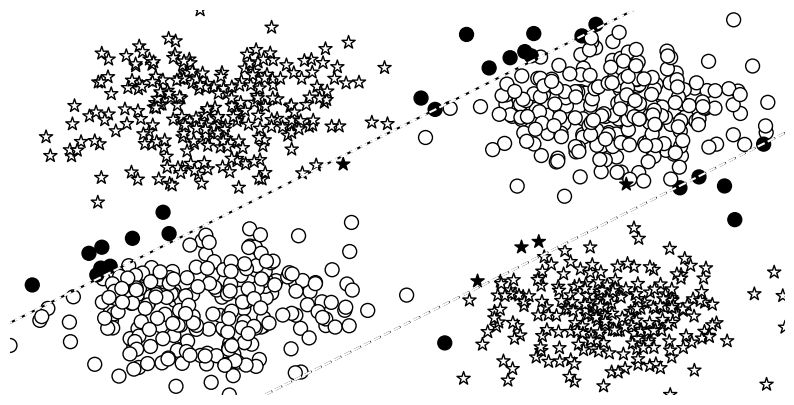

In [72]:
# Create a single subplot with specified size
_, ax = plt.subplots(1, 1, figsize=(10, 5))

# Visualize the results of the trained MLP (mlp3) on static data
visualize_results(mlp3, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=ax)

# Turn off axis labels for cleaner visualization
plt.axis('off')

# Save the visualization as an image file
plt.savefig('mlp3_final.png')


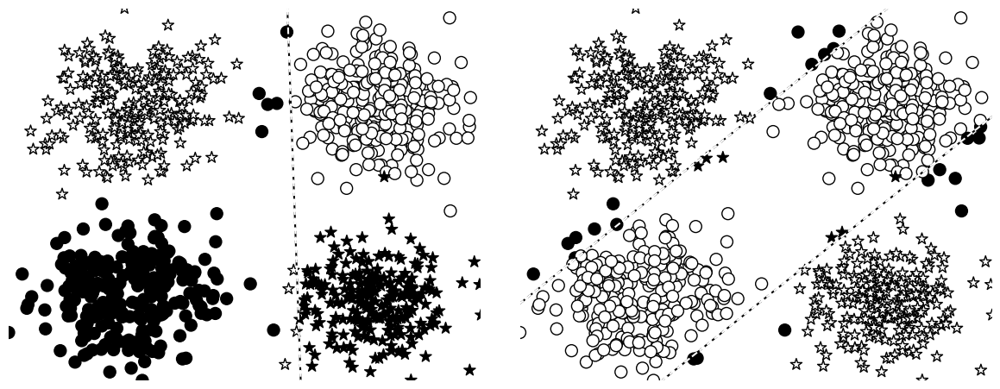

In [73]:
# Create a figure with 1 row and 2 columns of subplots, specified size (12, 5)
_, axes = plt.subplots(1, 2, figsize=(12, 5))

# Visualize the results of the trained MLP (mlp1) on static data in the first subplot
visualize_results(mlp1, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=axes[0])

# Visualize the results of the trained MLP (mlp2) on static data in the second subplot
visualize_results(mlp2, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=axes[1])

# Adjust layout for better spacing between subplots
plt.tight_layout()

# Turn off axis labels for both subplots
axes[0].axis('off')
axes[1].axis('off')

# Save the figure as an image file and a PDF file
plt.savefig("perceptron_vs_mlp2.png")
plt.savefig("figure_4_3.pdf")


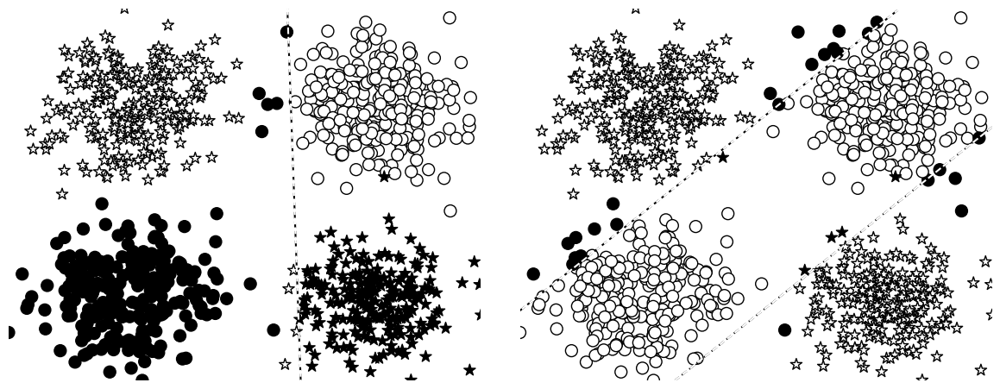

In [74]:
# Create a figure with 1 row and 2 columns of subplots, specified size (12, 5)
_, axes = plt.subplots(1, 2, figsize=(12, 5))

# Visualize the results of the trained MLP (mlp1) on static data in the first subplot
visualize_results(mlp1, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=axes[0])

# Visualize the results of the trained MLP (mlp3) on static data in the second subplot
visualize_results(mlp3, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=axes[1])

# Adjust layout for better spacing between subplots
plt.tight_layout()

# Turn off axis labels for both subplots
axes[0].axis('off')
axes[1].axis('off')

# Save the figure as an image file
plt.savefig("perceptron_vs_mlp3.png")


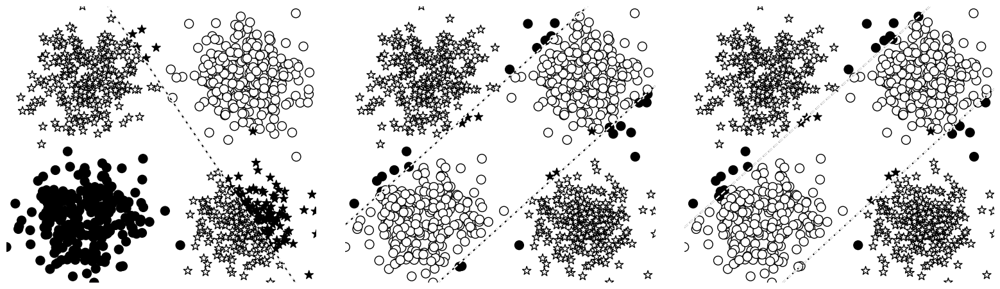

In [40]:
# Create a figure with 1 row and 3 columns of subplots, specified size (16, 5)
_, axes = plt.subplots(1, 3, figsize=(16, 5))

# Visualize the results of the trained MLP (mlp1) on static data in the first subplot
visualize_results(mlp1, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=axes[0])

# Visualize the results of the trained MLP (mlp2) on static data in the second subplot
visualize_results(mlp2, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=axes[1])

# Visualize the results of the trained MLP (mlp3) on static data in the third subplot
visualize_results(mlp3, x_data_static, y_truth_static, epoch=None, levels=[0.5], ax=axes[2])

# Adjust layout for better spacing between subplots
plt.tight_layout()

# Turn off axis labels for all three subplots
axes[0].axis('off')
axes[1].axis('off')
axes[2].axis('off')

# Save the figure as an image file
plt.savefig("perceptron_vs_mlp2_vs_mlp3.png")


### Inspecting the representations

In [76]:
batch_size = 100

In [77]:
def plot_intermediate_representations(mlp_model, plot_title, figsize=(10,2)):
    # Fetch toy data
    x_data, y_target = get_toy_data(batch_size)

    # Perform a forward pass with the MLP and detach the tensor to convert to NumPy array
    y_pred = mlp_model(x_data, True).detach().numpy()

    # Convert tensors to NumPy arrays for plotting
    x_data = x_data.numpy()
    y_target = y_target.numpy()

    # Define colors and markers for the two classes
    colors = ['black', 'white'] 
    markers = ['o', '*'] 

    # Initialize indices for class 0 and class 1
    class_zero_indices = []
    class_one_indices = []

    # Organize data indices based on class
    for i in range(y_target.shape[0]):
        if y_target[i] == 0:
            class_zero_indices.append(i)
        else:
            class_one_indices.append(i)

    class_zero_indices = np.array(class_zero_indices)
    class_one_indices = np.array(class_one_indices)

    # Create subplots based on the number of intermediate representations
    fig, axes = plt.subplots(1, len(mlp_model.last_forward_cache), figsize=figsize)

    # Loop over classes (0 and 1)
    for class_index, data_indices in enumerate([class_zero_indices, class_one_indices]):
        # Scatter plot for the original data in the first subplot
        axes[0].scatter(x_data[data_indices,0], x_data[data_indices,1], edgecolor='black', facecolor="white",
                            marker=markers[class_index], s=[200,400][class_index])
        axes[0].axis('off')

        # Scatter plots for intermediate representations in subsequent subplots
        for i, activations in enumerate(mlp_model.last_forward_cache[1:], 1):
            axes[i].scatter(activations[data_indices,0], activations[data_indices,1], edgecolor='black', facecolor="white",
                            marker=markers[class_index], s=[200,400][class_index])
            axes[i].axis('off')

    # Adjust layout for better spacing
    plt.tight_layout()

    # Set the main title for the entire figure
    plt.suptitle(plot_title, size=15)
    
    # Adjust the position of the main title
    plt.subplots_adjust(top=0.75)


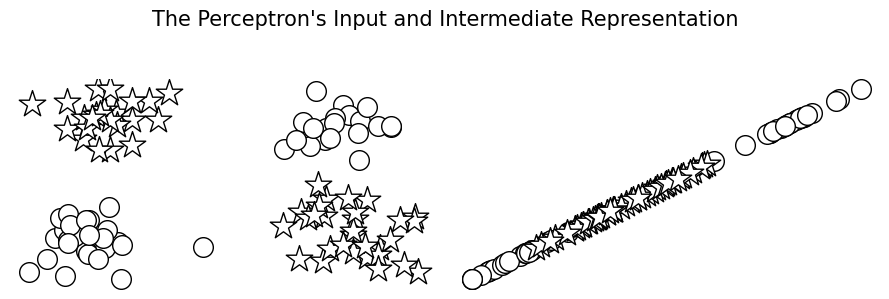

In [43]:
# Call the function to plot intermediate representations for the Perceptron
plot_intermediate_representations(mlp1, 
                                  "The Perceptron's Input and Intermediate Representation",
                                  figsize=(9, 3))

# Save the plotted figure as an image file (PNG)
plt.savefig("perceptron_intermediate.png")

# Save the plotted figure as a PDF file
plt.savefig("figure_4_5.pdf")


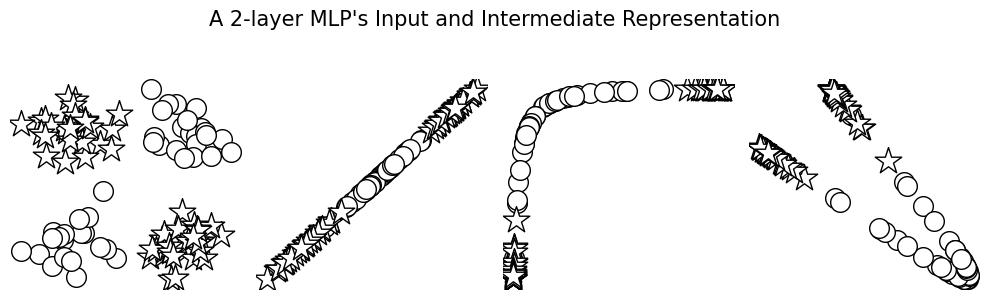

In [78]:
# Call the function to plot intermediate representations for the 2-layer MLP
plot_intermediate_representations(mlp2,
                                  "A 2-layer MLP's Input and Intermediate Representation",
                                  figsize=(10, 3))

# Save the plotted figure as an image file (PNG)
plt.savefig("mlp2_intermediate.png")

# Save the plotted figure as a PDF file
plt.savefig("figure_4_4.pdf")


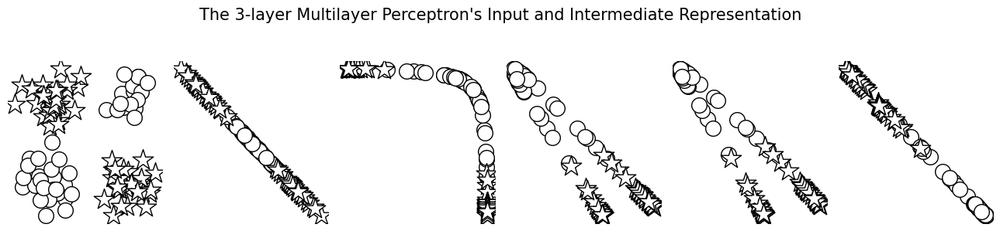

In [79]:
# Call the function to plot intermediate representations for the 3-layer MLP
plot_intermediate_representations(mlp3, 
                                  "The 3-layer Multilayer Perceptron's Input and Intermediate Representation",
                                  figsize=(13, 3))

# Save the plotted figure as an image file (PNG)
plt.savefig("mlp3_intermediate.png")

# Save the plotted figure as a PDF file
plt.savefig("mlp3_intermediate.pdf")


In [ ]:
# Exploration Questions

In [ ]:
# 1. Modifying MLP architecture can lead to a number of things:

# Increasing Hidden Layers: Adding more hidden layers may allow the model to learn more complex representations. It can be beneficial for capturing intricate patterns in the data. However, it also increases the risk of overfitting, especially if the dataset is not large enough. Additional layers may require more data to avoid memorizing noise.
# Reducing Hidden Layers: Removing hidden layers might simplify the model, making it more interpretable and potentially reducing the risk of overfitting. However, if the problem is complex, a shallower network might struggle to capture intricate patterns.
# Number of Nodes in Hidden Layers:

# Increasing Nodes: Adding more nodes to hidden layers increases the capacity of the model to learn complex relationships. It allows the network to capture more features from the data. However, it may also lead to longer training times and an increased risk of overfitting if not properly regularized.
# Reducing Nodes: Decreasing the number of nodes can reduce model complexity, potentially improving generalization to new, unseen data. However, too few nodes may result in underfitting, and the model might struggle to capture important patterns in the data.

# Training Dynamics:

# More Complexity: Increasing the model's complexity may require more training time and data to converge to a good solution. Deep architectures might benefit from more sophisticated optimization techniques and longer training schedules.
# Less Complexity: Simpler architectures may converge faster during training, but they might not capture the complexity of the underlying data distribution.
# Interpretability:

# More Complexity: Deeper architectures might be harder to interpret and understand due to the increased number of parameters and transformations.
# Less Complexity: Simpler architectures are often more interpretable and might provide clearer insights into the learned representations.
# Risk of Overfitting:

# More Complexity: Increasing the model's capacity raises the risk of overfitting. Regularization techniques (e.g., dropout, weight decay) can help mitigate this risk.
# Less Complexity: Simpler models are less prone to overfitting but may struggle to capture intricate patterns in the data.

In [ ]:
# 2. The hierarchical and abstract nature of intermediate representations allows neural networks to 
# automatically learn and represent non-trivial patterns in data, enabling them to excel in complex tasks such as 
# image recognition, natural language processing, and other intricate pattern recognition problems.

In [ ]:
# 3. The computation of decision boundaries in MLPs differs from traditional perceptrons due to the introduction 
# of non-linear activation functions, multiple layers, and the ability to learn complex, non-linear relationships in the data. 
# MLPs are more flexible and powerful in capturing intricate patterns, making them suitable for a wide range of machine learning tasks, 
# including image recognition, natural language processing, and other complex pattern recognition problems

In [ ]:
# 4. The program provided sets a fixed number of epochs to be used as a stopping point for training. However, it would
# also be logical to set a threshhold boundary, where the convergence stabalizes and repeated training is useless, thus stopping
# the training. Additional methods can undoubtedly be employed as well to stop the training algorithim.

In [ ]:
# 5. 